## Practical Work 4

For this practical work, the student will have to develop a Python program that is able to implement the accelerated gradient descent methods with adaptive learning rate <b>(Adagrad, RMSProp, and Adam)</b> in order to achieve the linear regression of a set of datapoints.
##### Please notice that we will apply these algorithm to single variable LR.

#### Import numpy, matplotlib.pyplot and make it inline

In [4]:
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

To have a dataset or set of data points, the student must generate a pair of arrays <b>X</b> and <b>y</b> with the values in <b>X</b> equally distributed between <b>0</b> and <b>20</b> and the values in <b>y</b> such that: 
<b>yi = a*xi + b (and a = -1, b = 2)</b>


In [5]:
X = np.linspace(0,20)
X = X.reshape((50,1))


In [6]:
X.shape

(50, 1)

In [7]:
a=-1
b=2
y=a*X+b
y

array([[  2.        ],
       [  1.59183673],
       [  1.18367347],
       [  0.7755102 ],
       [  0.36734694],
       [ -0.04081633],
       [ -0.44897959],
       [ -0.85714286],
       [ -1.26530612],
       [ -1.67346939],
       [ -2.08163265],
       [ -2.48979592],
       [ -2.89795918],
       [ -3.30612245],
       [ -3.71428571],
       [ -4.12244898],
       [ -4.53061224],
       [ -4.93877551],
       [ -5.34693878],
       [ -5.75510204],
       [ -6.16326531],
       [ -6.57142857],
       [ -6.97959184],
       [ -7.3877551 ],
       [ -7.79591837],
       [ -8.20408163],
       [ -8.6122449 ],
       [ -9.02040816],
       [ -9.42857143],
       [ -9.83673469],
       [-10.24489796],
       [-10.65306122],
       [-11.06122449],
       [-11.46938776],
       [-11.87755102],
       [-12.28571429],
       [-12.69387755],
       [-13.10204082],
       [-13.51020408],
       [-13.91836735],
       [-14.32653061],
       [-14.73469388],
       [-15.14285714],
       [-15

#### Plot X vs. y

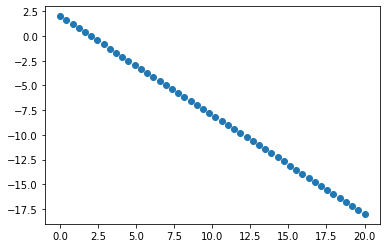

In [8]:
plt.scatter(X , y)

In [9]:
import math


In [38]:
def predict(theta0,theta1,X):
    h=theta0+theta1*X
    return h
def calc_error(h , y):
    m = len(y)
    error = (h - y)
    j = (error.T@error) /(2*m)
    return (error , j)

def calc_d_theta(h , y ,X , m):
    d_theta0 =np.sum(h - y) /m
    d_theta1 = np.sum((h-y)*X) / m
    g_vec =np.array([[d_theta0 ] , [d_theta1]])
    return(d_theta0 , d_theta1, g_vec)


def updatae_theta_Adagrad(theta0 ,v_t_0 , theta1,v_t_1,d_theta0 , d_theta1 ,a ,e):
    theta_0_new = theta0 - a /(math.sqrt(v_t_0)+e )*d_theta0
    theta_1_new = theta1 - a /(math.sqrt(v_t_1)+e )*d_theta1
    return (theta_0_new,theta_1_new )


def updatae_theta_Adam(theta0 ,v_t_0 , theta1,v_t_1  ,a ,e ,m_hat0 , m_hat1 ):
    theta_0_new = theta0 - (a /(math.sqrt(v_t_0)+e ))*m_hat0
    theta_1_new = theta1 - (a /(math.sqrt(v_t_1)+e ))*m_hat1
    return (theta_0_new,theta_1_new )

## Adam

### Update the previos implementation to be Adam.
#### Compare your results with Adagrad and RMSProp results.

In [50]:
def Adam (X , y , a , e, iterations  , b1 , b2):
    costs_hestory=[]
    theta_0_new1 = 0 
    theta_1_new1=0
    mts1 =[0]
    mts0 =[0]
    vts0=[0]
    vts1=[0]
    thetas0 =[]
    thetas1=[]
    hs =[]
    m =len(X)
    for i in range(iterations):
        print(f' #################   In the iteration {i} #############################################################')
        h = theta_0_new1+theta_1_new1*X
        error1 , j1 = calc_error(h  , y )
        costs_hestory.append(j1[0][0])
        print('Error Vec  \n'+str(error1)+'\n')
        print('j = '+str(j1))
        print()
        d_theta01 , d_theta11 , e_vec=calc_d_theta(h=h , m=m , X=X ,y=y)
        ###### m (t+1) =b1 * mt +(1-b1)* dtheta
        
        mt0 =b1*mts0[i]+(1-b1)*d_theta01
        mt1 = b1*mts1[i]+(1-b1)*d_theta11
        mts0.append(mt0)
        mts1.append(mt1)
        ########### v(t+1) = b2 * vt +(1- b2 )* d_theta**2
        vt0 = b2 *vts0[i]+(1-b2)*((d_theta01)**2)
        vt1 = b2 *vts1[i]+(1-b2)*((d_theta11)**2)
        
        vts0.append(vt0)
        vts1.append(vt1)
        ########
        m_hat0  = mt0/(1 - b1**(i+1))
        m_hat1  = mt1/(1 - b1**(i+1))
        v_hat0 = vt0 /(1-b2**(i+1))
        v_hat1 = vt1 /(1-b2**(i+1))
        grad_norm = np.linalg.norm(e_vec)
        print('d_theta0 : '+str(d_theta01))
        print('d_theta1 : '+str(d_theta11))
        print('the gradient vec is ' +str(e_vec))
        print('the gradient vec norm is ' +str(grad_norm))
        hs.append(h)
        thetas0.append(theta_0_new1)
        thetas1.append(theta_1_new1)
        if i !=0:
            if abs(costs_hestory[i] -costs_hestory[i-1]) <=0.001:
                break
        if grad_norm<0.001:
            break            
        theta_0_new1 ,theta_1_new1 =updatae_theta_Adam(theta_0_new1 ,v_hat0,theta_1_new1 ,v_hat1 , a ,e ,m_hat0 , m_hat1)
        #theta_0_new1 , theta_1_new1 = updatae_theta_Adagrad(theta0=theta_0_new1 , theta1=theta_1_new1 , v_t_1=v_t_1 , v_t_0 = v_t_0
         #                                               ,d_theta0=d_theta01 ,d_theta1=d_theta11,a=a,e=e )
        

        print('theta_0_new : '+str(theta_0_new1))
        print('theta_1_new : '+str(theta_1_new1))
    print('#################################################################################')
    print('theta0 optemal '+str(theta_0_new1))
    print('theta1 optemal '+str(theta_1_new1))
    return (theta_0_new1 , theta_1_new1 , costs_hestory , thetas0 , thetas1 , hs)
        
        
        
        
        
    
    
    


##### The following results uses alpha = 0.05, beta1 = 0.05, beta2 = 0.7, epsilon =  1e-08, and max. iterations = 500.

In [51]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.05 , 1e-08, 500  , 0.2 , 0.7)

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

In [55]:
h = predict(theta0 , theta1 ,X)  
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9989675218213927


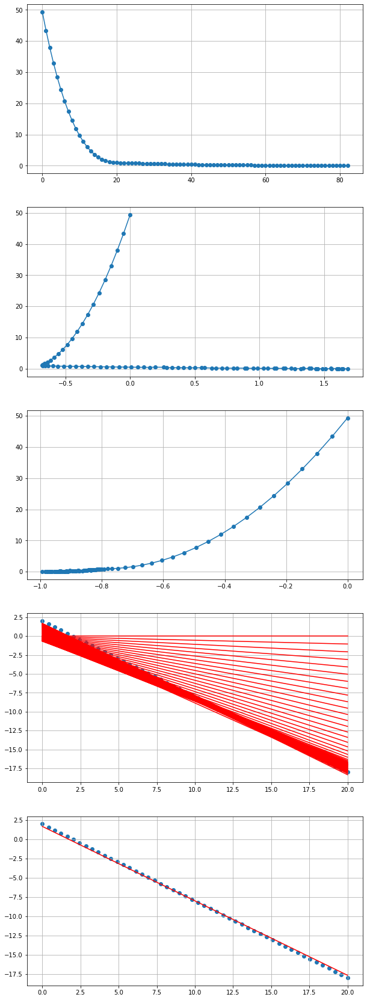

In [56]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

##### The following results uses alpha = 0.005, beta1 = 0.5, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 500.

In [57]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.005 , 1e-08, 500  , 0.5, 0.8)

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

In [58]:
h = predict(theta0 , theta1 ,X)  
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9927017859640472


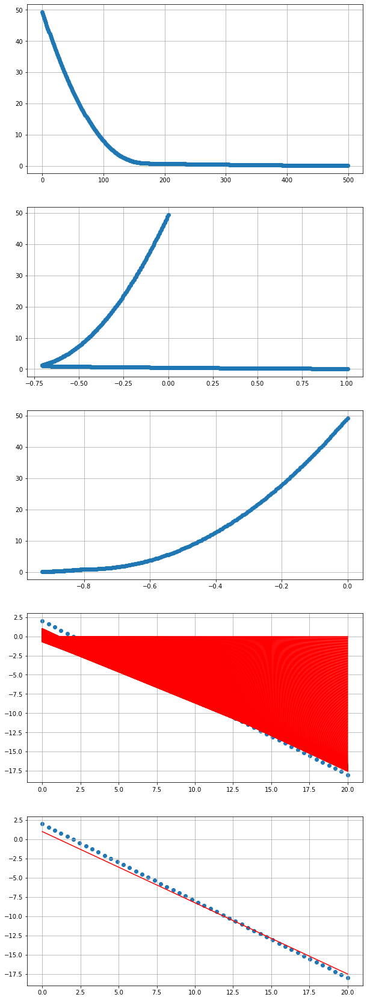

In [59]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

##### The following results uses alpha = 0.0005, beta1 = 0.8, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 5000.

In [61]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.0005 , 1e-08, 5000  , 0.8 , 0.8)
h = predict(theta0 , theta1 ,X) 

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

****************** Iteration 0 ********************

h(x):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
[-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j = 49.34693877551021

Gradient Vector:
[[  8.        ]
 [114.69387755]]

Gradient Vector Norm:
114.97254258164628

m_0_0 : 1.5999999999999996
m_1_0 : 22.93877551

In [63]:
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9467806664066584


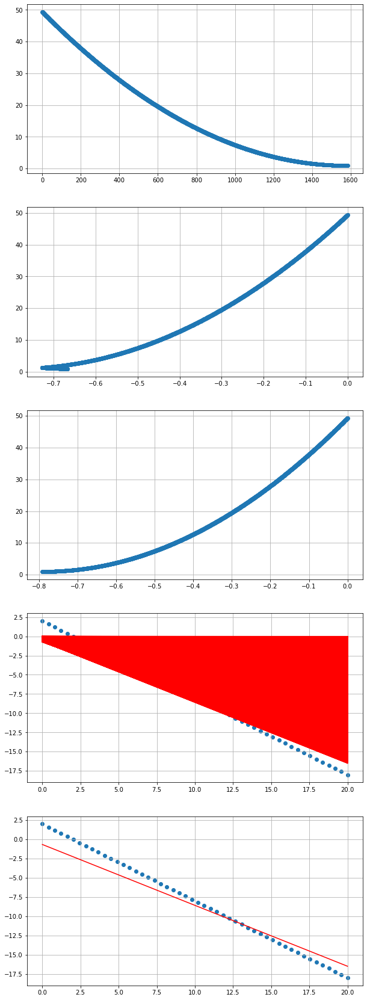

In [64]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

### Play with the parameters and see the results

In [65]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.001 , 1e-08, 5000  , 0.9 , 0.99)
h = predict(theta0 , theta1 ,X)


 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [66]:
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9485667803280174


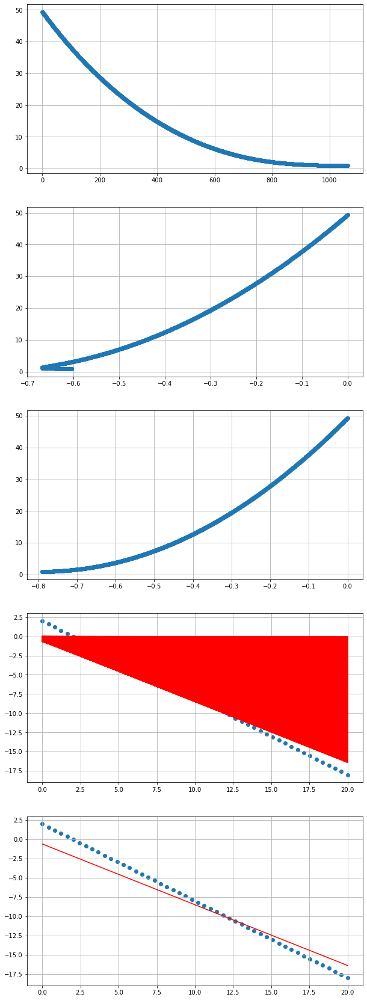

In [67]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

In [70]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.001 , 1e-08, 5000  , 0.9 , 0.5)

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [71]:
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.944245878919177


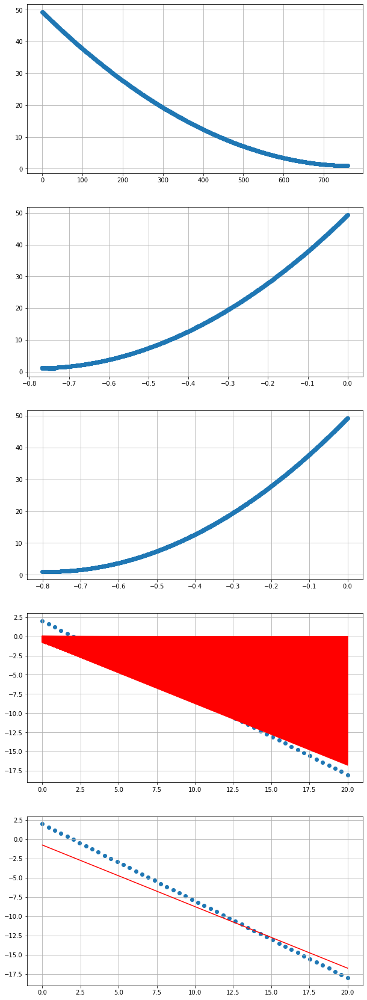

In [72]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

In [73]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.001 , 1e-08, 5000  , 0.5 , 0.99)

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

In [74]:
h = predict(theta0 , theta1 ,X)  
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.949344733641701


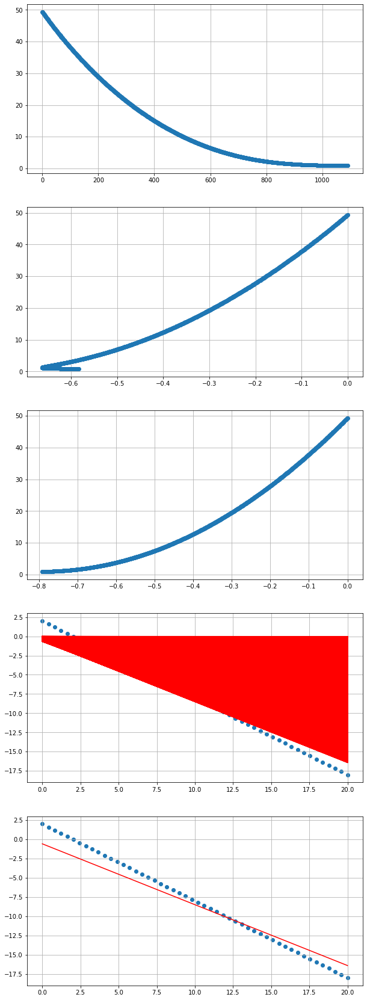

In [75]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

In [77]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.001 , 1e-08, 5000  , 0.5 , 0.5)
h = predict(theta0 , theta1 ,X)  

 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

In [78]:
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9475845101116701


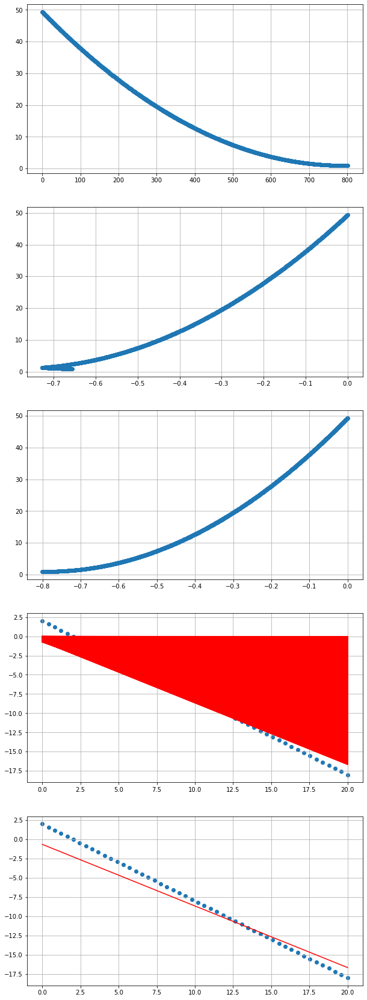

In [79]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

In [80]:
theta0, theta1 , costs_hestory , thetas0 , thetas1 , hs =Adam (X , y , 0.01 , 1e-08, 5000  , 0.9 , 0.99)
h = predict(theta0 , theta1 ,X)  


 #################   In the iteration 0 #############################################################
Error Vec  
[[-2.        ]
 [-1.59183673]
 [-1.18367347]
 [-0.7755102 ]
 [-0.36734694]
 [ 0.04081633]
 [ 0.44897959]
 [ 0.85714286]
 [ 1.26530612]
 [ 1.67346939]
 [ 2.08163265]
 [ 2.48979592]
 [ 2.89795918]
 [ 3.30612245]
 [ 3.71428571]
 [ 4.12244898]
 [ 4.53061224]
 [ 4.93877551]
 [ 5.34693878]
 [ 5.75510204]
 [ 6.16326531]
 [ 6.57142857]
 [ 6.97959184]
 [ 7.3877551 ]
 [ 7.79591837]
 [ 8.20408163]
 [ 8.6122449 ]
 [ 9.02040816]
 [ 9.42857143]
 [ 9.83673469]
 [10.24489796]
 [10.65306122]
 [11.06122449]
 [11.46938776]
 [11.87755102]
 [12.28571429]
 [12.69387755]
 [13.10204082]
 [13.51020408]
 [13.91836735]
 [14.32653061]
 [14.73469388]
 [15.14285714]
 [15.55102041]
 [15.95918367]
 [16.36734694]
 [16.7755102 ]
 [17.18367347]
 [17.59183673]
 [18.        ]]

j = [[49.34693878]]

d_theta0 : 8.0
d_theta1 : 114.69387755102042
the gradient vec is [[  8.        ]
 [114.69387755]]
the gradient ve

##### The following results uses alpha = 0.01, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

r2 score is 0.9952892444628807


In [83]:
print(f'r2 score is {r2_score(y,h)}')

r2 score is 0.9952892444628807


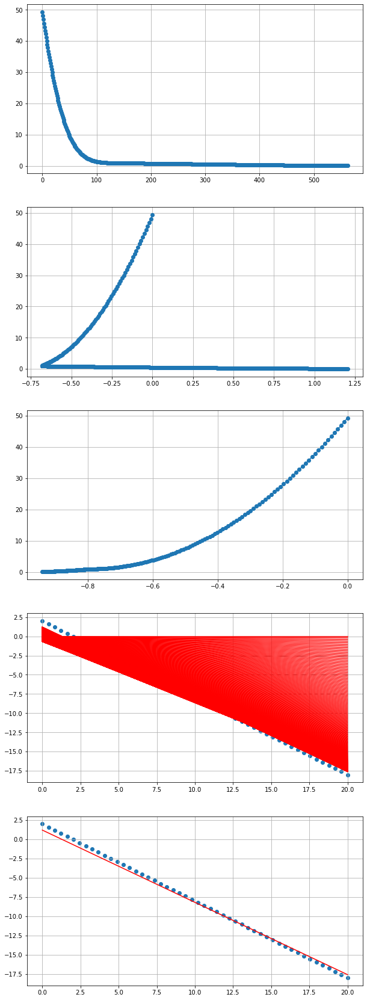

In [84]:
plot_1(X,y, thetas0 , thetas1  ,costs_hestory , hs , h)

## Congratulations 
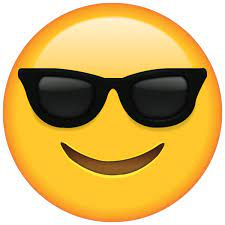